In [212]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import dython as dy
import plotly.express as px
from pandas_profiling import ProfileReport
from sklearn.preprocessing import MultiLabelBinarizer, RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import plotly.figure_factory as ff
from sklearn.model_selection import StratifiedShuffleSplit
import seaborn as sns

# Loading the dataset

In [145]:
df = pd.read_csv('./data/dataset.csv')
print(df.shape)
df.head(5)

(1000, 9)


,id,water,uv,area,fertilizer_usage,yield,pesticides,region,categories
0,169,5.615,65.281,3.230,0,7.977,8.969,0,"b,a,c"
1,476,7.044,73.319,9.081,0,23.009,7.197,0,"c,a,d"
2,152,5.607,60.038,2.864,2,23.019,7.424,0,"d,a"
3,293,9.346,64.719,2.797,2,28.066,1.256,0,d
4,10,7.969,NaN,5.407,1,29.140,0.274,0,"c,d"


In [146]:
# Setting id as index
df.set_index('id', inplace=True)

# Generating Profile report using pandas_profiling

In [147]:
ProfileReport(df, title ='Crop Yield Dataset').to_notebook_iframe()

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Identifying types of features
After studying the data dictionary, it is evident that following features are categorical:
1. Fertilizer_usage (ordinal)
2. Region (nominal)
3. Pesticides categories(nominal)

And, rest are numerical.

In [95]:
# Describing the numerical features in the dataset

numerical_columns = ['water', 'uv', 'area', 'yield']
df[numerical_columns].describe()

,water,uv,area,yield
count,958.000000,949.000000,1000.000000,1000.000000
mean,12.223546,73.957488,8.098848,58.758571
std,172.335566,9.904063,2.692632,24.563683
min,0.072000,45.264000,0.263000,2.843000
25%,4.584750,66.502000,6.297000,40.698000
50%,6.476000,73.689000,7.987500,55.602500
75%,8.758750,80.554000,9.900250,73.645500
max,5340.000000,106.310000,18.311000,148.845000


# Handling the Missing Values

In [148]:
df.isna().sum()

water               42
uv                  51
area                 0
fertilizer_usage     0
yield                0
pesticides           0
region               0
categories           0
dtype: int64

Since Water and UV ( light received) is dependent on region the farm is located, it is best
to fill up the missing values grouped by region

In [149]:
df['water'] = df.groupby('region')['water'].transform(lambda x:x.fillna(x.mean()))
df['uv'] = df.groupby('region')['uv'].transform(lambda x:x.fillna(x.mean()))

In [150]:
df.isna().sum()

water               0
uv                  0
area                0
fertilizer_usage    0
yield               0
pesticides          0
region              0
categories          0
dtype: int64

Perfect! Now that data cleaning is done. we can move to data processing

# Handling the Categorical Features
It is best to label encode ordinal features(fertilizer usage) and one hot encode norminal features( region & categories)

<AxesSubplot:>

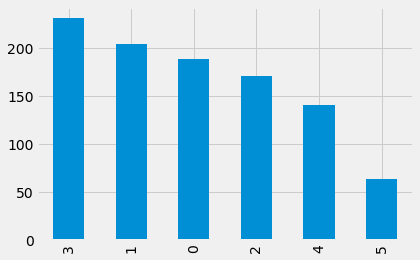

In [154]:
# Keeping it as it as because it is already encoded
df['fertilizer_usage'].value_counts().plot(kind='bar')

Handling 'region' by creating dummy features of each categories

In [ ]:
df = pd.get_dummies(df, columns=['region'], dtype=np.int64)

Handling 'categories' by splitting the string and using multilabelbinarizer to make one hot encoded columns

In [ ]:
# Splitting the entries so that it can be ingested to binarizer
df['categories'] = df['categories'].transform(lambda x: x.split(','))

mlb = MultiLabelBinarizer()
cats = pd.DataFrame(mlb.fit_transform(df['categories']),columns=mlb.classes_, index=df.index)
print (cats)

In [157]:
# Renaming the column value
cats.columns = 'pesticide_' + cats.columns.values
df = pd.concat([df.drop(columns='categories'), cats], axis=1)
df

,water,uv,area,fertilizer_usage,yield,pesticides,region_0,region_1,region_2,region_3,region_4,region_5,region_6,pesticide_a,pesticide_b,pesticide_c,pesticide_d
id,,,,,,,,,,,,,,,,,
169,5.615000,65.281000,3.230,0,7.977,8.969,1,0,0,0,0,0,0,1,1,1,0
476,7.044000,73.319000,9.081,0,23.009,7.197,1,0,0,0,0,0,0,1,0,1,1
152,5.607000,60.038000,2.864,2,23.019,7.424,1,0,0,0,0,0,0,1,0,0,1
293,9.346000,64.719000,2.797,2,28.066,1.256,1,0,0,0,0,0,0,0,0,0,1
10,7.969000,73.711481,5.407,1,29.140,0.274,1,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
614,6.379000,94.132000,11.571,5,98.673,2.891,0,0,0,0,0,0,1,0,1,1,0
490,6.980000,82.727000,11.264,5,101.090,3.500,0,0,0,0,0,0,1,0,1,1,1
392,6.752131,58.218000,11.859,4,103.673,4.005,0,0,0,0,0,0,1,1,1,1,0


# Handling outliers

In [178]:
fig = ff.create_distplot([df[col] for col in df[numerical_columns].columns], df[numerical_columns].columns,
                         bin_size='auto')
fig.show()

Clearly feature 'water' have some outliers

In [180]:
df[df['water']> 90].head(10)

,water,uv,area,fertilizer_usage,yield,pesticides,region_0,region_1,region_2,region_3,region_4,region_5,region_6,pesticide_a,pesticide_b,pesticide_c,pesticide_d
id,,,,,,,,,,,,,,,,,
303,105.258185,77.619,6.824,1,30.967,1.497,1,0,0,0,0,0,0,1,1,1,1
18,105.258185,77.431,6.779,0,38.773,4.901,1,0,0,0,0,0,0,1,1,0,1
952,105.258185,70.481,6.898,0,39.184,5.035,1,0,0,0,0,0,0,1,1,1,1
586,5340.000000,91.224,8.429,2,67.321,2.933,1,0,0,0,0,0,0,1,0,1,0
45,105.258185,82.678,9.107,2,68.502,0.239,1,0,0,0,0,0,0,0,1,0,1
312,105.258185,73.670,9.928,4,100.215,6.923,1,0,0,0,0,0,0,0,0,0,1


Since it has been known through data dictionary that all the farms are located inside a country,
It is safe to impute the value or simply drop the record

In [181]:
# Dropping the most extreme observation
df.drop(df[df['water'] >500].index, inplace=True)

Checking again for the distribution

In [183]:
fig = ff.create_distplot([df[col] for col in df[numerical_columns].columns], df[numerical_columns].columns,
                         bin_size='auto')
fig.show()

Since we have 5 observations with rainfall above IQR, we can assume it is a special case.
IF model shows bias towards these values, we will come again and replace them with maximum percentile
Values. For now, let's move forward.

# Feature Engineering

Plotting the co-relation plots between all the features

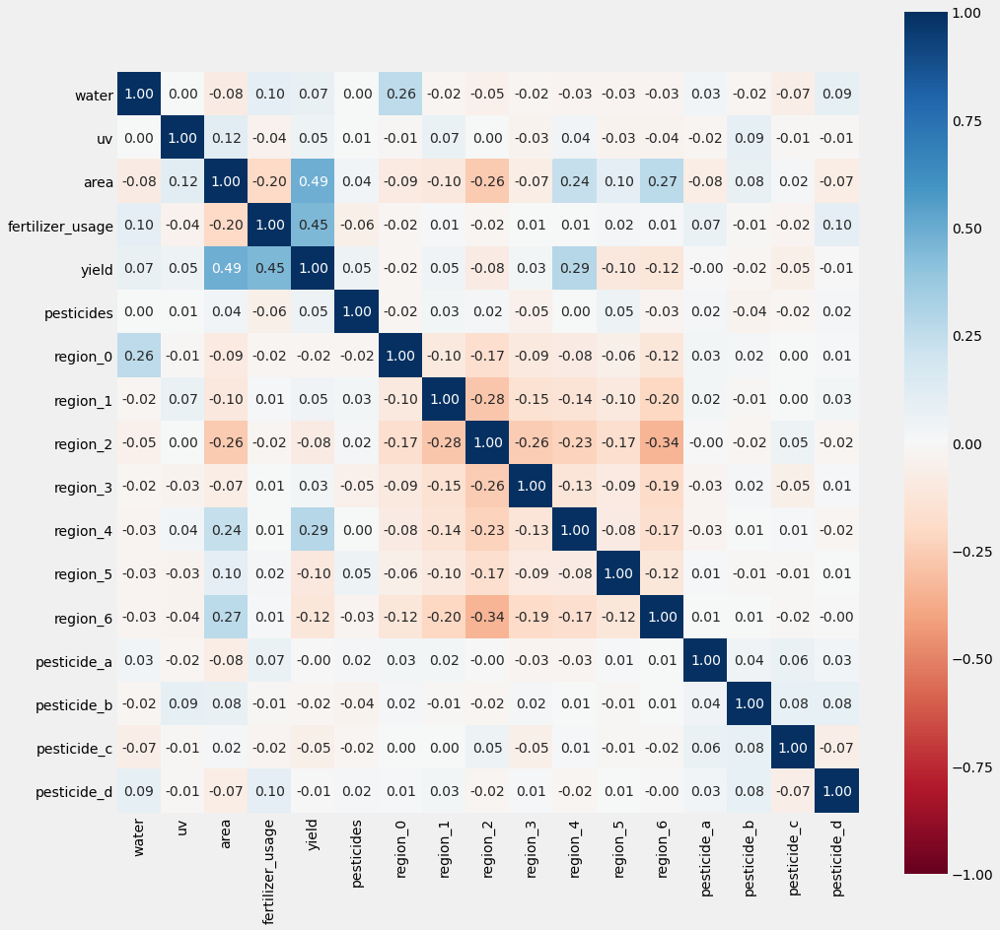

In [189]:
ax=dy.nominal.associations(df, figsize=(15,15), cmap='RdBu')

There is no extreme corelations between features, we are good to go!

Let us see how our different features are related to target 'yield

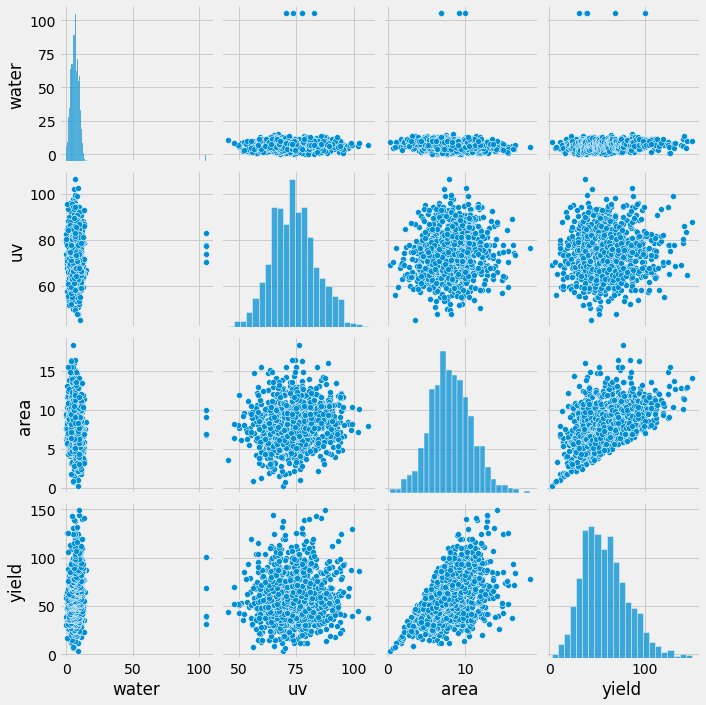

In [201]:
sns.pairplot(df[numerical_columns])
plt.show()

How the ordinal feature 'fertilizer usage' is related with yield.

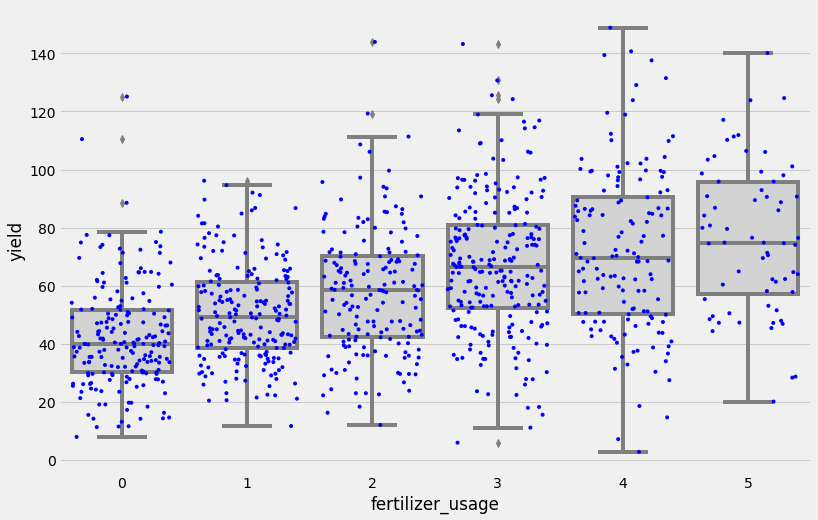

In [202]:
ax = plt.figure(figsize=(12,8))
ax = sns.boxplot(x='fertilizer_usage', y='yield', data=df, color='lightgrey', )
ax = sns.stripplot(x='fertilizer_usage', y='yield', data=df, color='blue', jitter=0.4, size=4)

My online research also indicated that usage of fertilizer is super important for yield maximization

# Normalization and Scaling:

Since the scales of water received, light received, and pesticides/fertilizers used are different,
it is best to scale them to normalize the observation.

We will use RobustScalar for this process.

To avoid any data leakage,we will scale the training set first and use the fitted parameters on the testing set subsequently.

Let us create a training and testing dataset!

As, I have assumed fertilizer usage as one of the critical indicator based on online research, to have a golden test dataset I would prefer that both train and test has equally distributed fertilizer usage values. Stratified shuffle split will help us maintain the required strata compositions here.

In [193]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(df.values, df.fertilizer_usage.values):
    train_set = df.iloc[train_index]
    test_set = df.iloc[test_index]

In [194]:
# this works like magic.
print(test_set.fertilizer_usage.value_counts(sort=False)/len(test_set), sep='\n')
print(df.fertilizer_usage.value_counts(sort=False)/len(df), sep='\n')

0    0.190
1    0.205
2    0.170
3    0.230
4    0.140
5    0.065
Name: fertilizer_usage, dtype: float64
0    0.189189
1    0.204204
2    0.170170
3    0.231231
4    0.141141
5    0.064064
Name: fertilizer_usage, dtype: float64


Issue with Scalar: Sklearn pipeline would have data leak. hence, should make custom Transformer

In [211]:
class NumericalTransformer(BaseEstimator, TransformerMixin):
    #Class Constructor
    def __init__( self, bath_per_bed = True, years_old = True ):
        self._bath_per_bed = bath_per_bed
        self._years_old = years_old

    #Return self, nothing else to do here
    def fit( self, X, y = None ):
        return self

    #Custom transform method we wrote that creates aformentioned features and drops redundant ones
    def transform(self, X, y = None):
        #Check if needed
        if self._bath_per_bed:
            #create new column
            X.loc[:,'bath_per_bed'] = X['bathrooms'] / X['bedrooms']
            #drop redundant column
            X.drop('bathrooms', axis = 1 )
        #Check if needed
        if self._years_old:
            #create new column
            X.loc[:,'years_old'] =  2019 - X['yr_built']
            #drop redundant column
            X.drop('yr_built', axis = 1)

        #Converting any infinity values in the dataset to Nan
        X = X.replace( [ np.inf, -np.inf ], np.nan )
        #returns a numpy array
        return X.values



id
169     5.615000
476     7.044000
152     5.607000
293     9.346000
10      7.969000
         ...    
614     6.379000
490     6.980000
392     6.752131
773    10.070000
104     7.679000
Name: water, Length: 999, dtype: float64

RobustScalar

In [205]:
to_scale_columns=['water', 'uv', 'area'] # Only these columns are needed to be scaled_train

scale = RobustScaler()

scaled_train = pd.DataFrame(scale.fit_transform(train_set[to_scale_columns]),
                       columns=train_set[to_scale_columns].columns,
                       index=train_set[to_scale_columns].index)

# Plugging scaled values to the original train set
train_set[to_scale_columns] = scaled_train

# For test set we will use parameters calculated in the training process to avoid leakage

scaled_test = pd.DataFrame(scale.fit_transform(test_set[to_scale_columns]),
                       columns=test_set[to_scale_columns].columns,
                       index=test_set[to_scale_columns].index)

test_set[to_scale_columns] = scaled_test

Visualizing the features after scaling

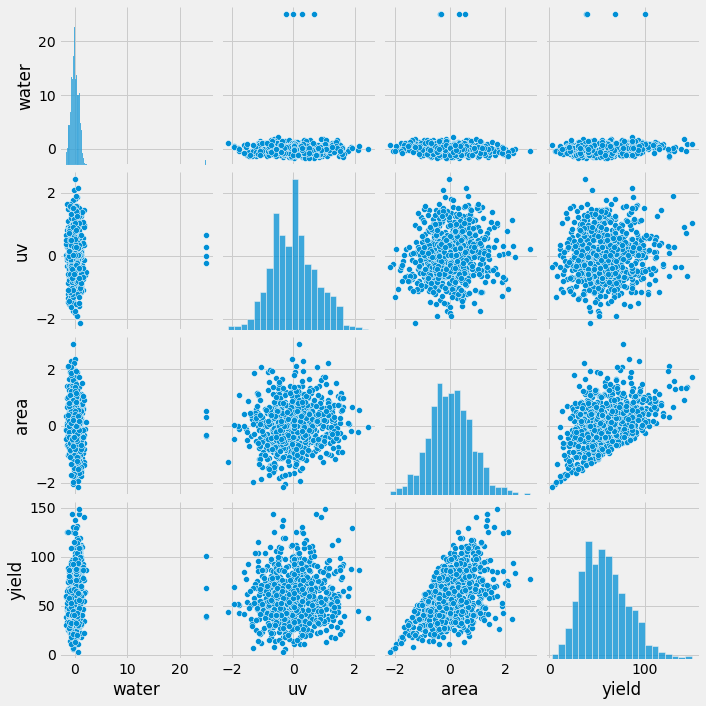

In [206]:
# temp_water_df = train_set.drop(train_set[train_set['water']> 150].index)
sns.pairplot(train_set[numerical_columns])
plt.show()

For now, we will keep the outlier in water. We will conduct second set of experiments after removing it by comparing accuracies of the model.

# Model Building

In [122]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

lin_reg = LinearRegression()
lin_reg.fit(X, y)

yield_predictions = lin_reg.predict(X)
lin_mse = mean_squared_error(y, yield_predictions)
lin_rmse = np.sqrt(lin_mse)
print('linear_train_rmse', lin_rmse) #model might be underfitting

from sklearn.model_selection import cross_val_score
scores = cross_val_score(lin_reg, X, y, scoring='neg_mean_squared_error', cv=10)
lin_rmse_scores = np.sqrt(-scores)

def explain_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

explain_scores(lin_rmse_scores)

linear_train_rmse 12.49082771863984
Scores: [13.26263893 10.49615411 11.94044204 13.42298943 13.07997198 13.90996417
 15.11520907 13.3232306  11.19517473 11.49488327]
Mean: 12.724065832497491
Standard deviation: 1.3346984056487465


In [123]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(X, y)

yield_predictions = tree_reg.predict(X)
tree_mse = mean_squared_error(y, yield_predictions)
tree_rmse = np.sqrt(tree_mse)
print('tree_train_rmse', tree_rmse) #model obviously overfitting

scores = cross_val_score(tree_reg, X, y, scoring='neg_mean_squared_error', cv=10)
tree_rmse_scores = np.sqrt(-scores)
explain_scores(tree_rmse_scores)

tree_train_rmse 0.0
Scores: [13.45149469 15.01322897 14.40218463 16.59701963 16.23200547 12.90664141
 13.7829997  14.60733993 17.99917981 12.75746784]
Mean: 14.77495620791247
Standard deviation: 1.623537522536894


In [125]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor()
rf_reg.fit(X, y)

yield_predictions = rf_reg.predict(X)
rf_mse = mean_squared_error(y, yield_predictions)
rf_rmse = np.sqrt(rf_mse)
print('rf_train_rmse', rf_rmse) #model is overfitting

scores = cross_val_score(rf_reg, X, y, scoring='neg_mean_squared_error', cv=10)
rf_rmse_scores = np.sqrt(-scores)
explain_scores(rf_rmse_scores)

rf_train_rmse 3.781368347156207
Scores: [12.13033829  9.74627272  9.71746747 10.88878502 10.34374465 10.029836
 11.13039388 10.18970963 10.4338755   9.51945718]
Mean: 10.412988034180719
Standard deviation: 0.7495926241139644


In [126]:
from sklearn.svm import SVR

svm_reg = SVR(kernel='linear')
svm_reg.fit(X, y)

yield_predictions = svm_reg.predict(X)
svm_mse = mean_squared_error(y, yield_predictions)
svm_rmse = np.sqrt(svm_mse)
print('svm_train_rmse', svm_rmse) #svm is generalizing well to crossvalidation set

scores = cross_val_score(svm_reg, X, y, scoring='neg_mean_squared_error', cv=10)
svm_rmse_scores = np.sqrt(-scores)
explain_scores(svm_rmse_scores)

svm_train_rmse 12.760788764579729
Scores: [13.38486709 10.78569278 12.55139274 13.37594945 13.29174072 13.99100711
 15.54426463 13.32354602 11.74159629 12.04684718]
Mean: 13.003690402397604
Standard deviation: 1.2462336024789895


In [127]:
from sklearn.neighbors import KNeighborsRegressor

knn_reg = KNeighborsRegressor()
knn_reg.fit(X, y)

yield_predictions = knn_reg.predict(X)
knn_mse = mean_squared_error(y, yield_predictions)
knn_rmse = np.sqrt(knn_mse)
print('knn_train_rmse', knn_rmse) #overfiiting

scores = cross_val_score(knn_reg, X, y, scoring='neg_mean_squared_error', cv=10)
knn_rmse_scores = np.sqrt(-scores)
explain_scores(knn_rmse_scores)

knn_train_rmse 10.948967900502723
Scores: [14.43140896 11.63259391 12.83714605 14.92283479 14.7375929  13.63399936
 15.71827857 13.86018224 14.05000209 12.58618969]
Mean: 13.84102285584044
Standard deviation: 1.1572912821758121


In [128]:
#lets improve the models with hyperparameter tuning

from sklearn.model_selection import GridSearchCV

param_grid = [{'bootstrap':[False,True],'n_estimators':[75,100,125,150,200], 'max_features':[1,2,4,6]}]

forest_reg = RandomForestRegressor()

grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error', return_train_score=True)

grid_search.fit(X, y)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid=[{'bootstrap': [False, True],
                          'max_features': [1, 2, 4, 6],
                          'n_estimators': [75, 100, 125, 150, 200]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [129]:
grid_search.best_params_

{'bootstrap': False, 'max_features': 6, 'n_estimators': 100}

In [130]:
grid_search.best_estimator_

RandomForestRegressor(bootstrap=False, max_features=6)

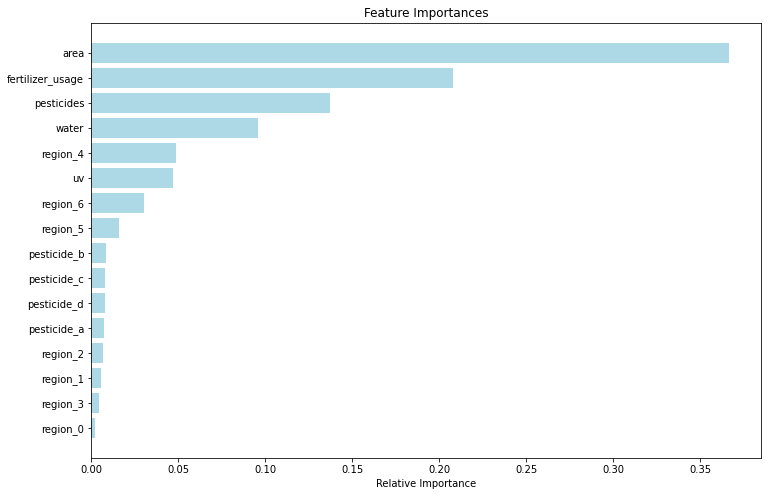

In [133]:
feature_importances = grid_search.best_estimator_.feature_importances_
attributes= X.columns
indices = np.argsort(feature_importances)
plt.figure(figsize=(12,8))
plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importances[indices], color='lightblue', align='center')
plt.yticks(range(len(indices)), [attributes[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


In [134]:
#lets try with RandomizedSearchCV

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_dist = {'n_estimators': randint(low=10, high=250),
              'max_features': randint(low=1, high=24),
             }

forest_reg = RandomForestRegressor(random_state=42)
rnd_search = RandomizedSearchCV(forest_reg, param_dist, n_iter=40, cv=5, scoring='neg_mean_squared_error', random_state=42)

rnd_search.fit(X, y)

/home/harshal/PycharmProjects/AltaMLTechnical/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/harshal/PycharmProjects/AltaMLTechnical/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/harshal/PycharmProjects/AltaMLTechnical/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/home/harshal/PycharmProjects/AltaMLTechnical/lib/python3.8/site-packages/joblib/parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "/home/harshal/PycharmProjects/AltaMLTechnical/lib/python3.8/site-packages/joblib/parallel.py", line 859, in dispatch_one_batch
    self._dispatch(ta

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=40,
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f06516ef820>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f06516ef640>},
                   random_state=42, scoring='neg_mean_squared_error')

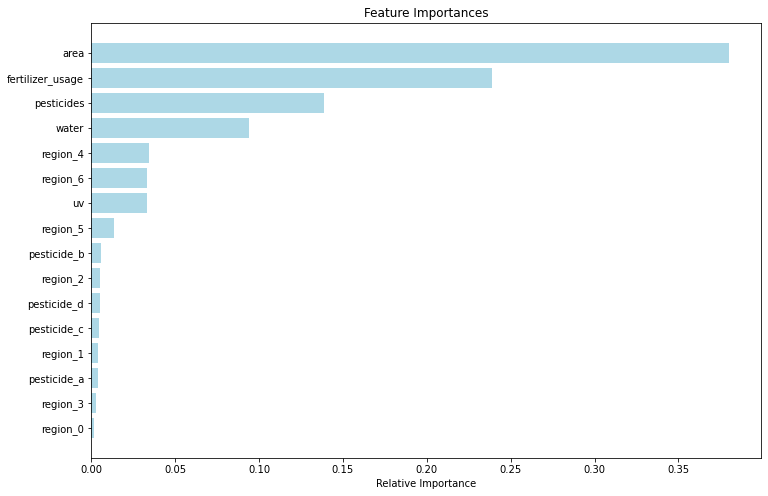

In [135]:
feature_importances = rnd_search.best_estimator_.feature_importances_
attributes= X.columns
indices = np.argsort(feature_importances)
plt.figure(figsize=(12,8))
plt.title('Feature Importances')
plt.barh(range(len(indices)), feature_importances[indices], color='lightblue', align='center')
plt.yticks(range(len(indices)), [attributes[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()